<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import pickle
from sklearn.linear_model import ElasticNet

from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from phik import phik_matrix
from ydata_profiling import ProfileReport
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error as MSE

import re

%matplotlib inline

random.seed(42)
np.random.seed(42)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Для **воспроизводимости результатов**: рандомные операции (например, инициализация весов, случайное разбиение данных и т.д.) при зафиксированном сиде будут одинаковы на нескольких запусках

Думаю, что самая главная причина фиксировать сид - это возможность дебага, с постоянным рандомом это было бы невозможно

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

Сначала посчитаем кол-во пропусков, причем, думаю, можно взглянуть по двум измерениям - строкам (объектам) и столбцам (фичам)

Посмотрим, где и сколько отсутствует значений:

In [3]:
def check_on_missing_values(df: pd.DataFrame, axis=0):
    return df.isnull().sum(axis=axis)

train_missing_values_on_cols = check_on_missing_values(df_train)
test_missing_values_on_cols = check_on_missing_values(df_test)

train_missing_values_on_rows = check_on_missing_values(df_train, axis=1)
test_missing_values_on_rows = check_on_missing_values(df_test, axis=1)

Сначала посмотрим на фичи

На train данных видим, что максимум пропусков в **tortque** (крутящий момент): 203/6999

Большинство же признаков без null-значений, это радует:

In [4]:
print(train_missing_values_on_cols.sort_values(ascending=False))

torque           203
mileage          202
engine           202
seats            202
max_power        196
name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
dtype: int64


В тесте ситуация с пропусками лучше (хотя там и данных в 7 раз меньше)

Прикидочно скажу, что раз отношение размеров теста к трейну 1 : 7, то в кол-ве пропусков (19 : 203) между тестом и трейном не такая уж и большая разница:

In [5]:
print(test_missing_values_on_cols.sort_values(ascending=False))

mileage          19
engine           19
max_power        19
torque           19
seats            19
name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
dtype: int64


Есть айтемы, у которых все 5 из возможных признаков отсутствуют:

In [6]:
print(train_missing_values_on_rows.sort_values(ascending=False))

2060    5
5059    5
175     5
4558    5
179     5
       ..
2377    0
2376    0
2375    0
2374    0
6998    0
Length: 6999, dtype: int64


In [7]:
print(test_missing_values_on_rows.sort_values(ascending=False))

118    5
149    5
295    5
471    5
781    5
      ..
343    0
344    0
345    0
346    0
999    0
Length: 1000, dtype: int64


In [8]:
def check_on_duplicates(df: pd.DataFrame):
    return df.duplicated().sum()

train_duplicates = check_on_duplicates(df_train)
test_duplicates = check_on_duplicates(df_test)

Полные дубликаты айтемов **есть**

Причем если опять взять отношение теста к трейну 1 : 7, то получается, что в трейне дубликатов в 2 с лишним раза больше:

In [9]:
print("Кол-во дубликатов в трейне: ", train_duplicates)
print("Кол-во дубликатов в тесте: ", test_duplicates)


Кол-во дубликатов в трейне:  985
Кол-во дубликатов в тесте:  62


In [10]:
profile_train = ProfileReport(df_train, title="Profiling Report for Train")
profile_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 339.30it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

На трейне видно, что Duplicate rows = 493, у меня же 985

Так происходит, потому что ProfileReport показывает кол-во уникальных дубликатов, мой код же подсчитывает общее кол-во строк-дубликатов

In [11]:
profile_test = ProfileReport(df_test, title="Profiling Report for Test")
profile_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 12745.66it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Базовые выводы:**

- В обоих датасетах есть дубликаты, которые лучше предварительно почистить

- Бывают пропуски в 5 фичах, их также необходимо будет обработать

- Пропусков и дубликатов не критично много, датасеты рабочие

- Из Alerts можно увидеть высокую корреляцию между признаками, например km-driven и year, что логично: чем старше машина, тем больше (скорее всего) у нее будет пробег. Та же проблема у transmission и selling_price

- seller_type несбалансирован: чаще всего это индивидуальные продавцы, реже - дилер

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [12]:
df_train.describe()

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [13]:
df_test.describe()

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [14]:
df_train.describe(include=['object'])

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [15]:
df_test.describe(include=['object'])

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


In [16]:
def compare_mean_median(df_1: pd.DataFrame, df_2: pd.DataFrame):
    for col in df_1.columns:
        if df_1[col].dtype in ['int64', 'float64']:
            mean_diff = abs(df_1[col].mean() - df_2[col].mean())
            median_diff = abs(df_1[col].median() - df_2[col].median())

            print(f"Среднее значение {col}: {df_1[col].mean():.3f} (трейн) и {df_2[col].mean():.3f} (тест)")
            print(f"Медиана {col}: {df_1[col].median():.3f} (трейн) и {df_2[col].median():.3f} (тест)")
            print(f"Разница в среднем значении {col}: {mean_diff:.3f}")
            print(f"Разница в медиане {col}: {median_diff:.3f}\n")

compare_mean_median(df_train, df_test)

Среднее значение year: 2013.818 (трейн) и 2013.681 (тест)
Медиана year: 2015.000 (трейн) и 2014.000 (тест)
Разница в среднем значении year: 0.137
Разница в медиане year: 1.000

Среднее значение selling_price: 639515.197 (трейн) и 617901.042 (тест)
Медиана selling_price: 450000.000 (трейн) и 434999.000 (тест)
Разница в среднем значении selling_price: 21614.155
Разница в медиане selling_price: 15001.000

Среднее значение km_driven: 69584.616 (трейн) и 71393.341 (тест)
Медиана km_driven: 60000.000 (трейн) и 61500.000 (тест)
Разница в среднем значении km_driven: 1808.725
Разница в медиане km_driven: 1500.000

Среднее значение seats: 5.419 (трейн) и 5.411 (тест)
Медиана seats: 5.000 (трейн) и 5.000 (тест)
Разница в среднем значении seats: 0.008
Разница в медиане seats: 0.000



**Выводы по статистикам:**

- Отличаются трейн и тест в selling_price и km_driven (держим в голове, что между ними сильная коррляция), из возможных причин, как мне кажется: выбросы в одном из датасетов (которые сдвинули среднее значение) или data drift между трейном и тестом (или просто отличающиеся данные). Скорее склоняюсь ко второму, т.к. разница в медианах также довольно приличная

- Для заполнения пропусков лучше использовать медиану, среднее значение могло подскачить из-за выбросов или ассиметричности данных (одних значений больше, чем других)

- По категорильнам признаком между трейном и тестом все выглядит согласовано

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [17]:
def find_duplicates(df: pd.DataFrame):
    feature_cols = [col for col in df.columns if col != 'selling_price']
    return df.duplicated(subset=feature_cols, keep=False)

duplicates_train = find_duplicates(df_train)
duplicates_test = find_duplicates(df_test)

In [18]:
print("Кол-во дубликатов в трейне: ", duplicates_train.sum())
print("Кол-во дубликатов в тесте: ", duplicates_test.sum())

Кол-во дубликатов в трейне:  1799
Кол-во дубликатов в тесте:  109


In [19]:
print(df_train[duplicates_train].head())

                               name  year  selling_price  km_driven    fuel  \
22          Maruti Baleno Delta 1.2  2016         575000      45000  Petrol   
26      Maruti Omni E MPI STD BS IV  2018         254999      25000  Petrol   
27  Maruti Vitara Brezza LDi Option  2017         670000      70000  Diesel   
28               Fiat Palio 1.2 ELX  2003          70000      50000  Petrol   
29        Maruti Omni 8 Seater BSIV  2012         150000      35000  Petrol   

   seller_type transmission         owner    mileage   engine max_power  \
22  Individual       Manual   First Owner  21.4 kmpl  1197 CC  83.1 bhp   
26  Individual       Manual   First Owner  16.8 kmpl   796 CC  34.2 bhp   
27  Individual       Manual   First Owner  24.3 kmpl  1248 CC  88.5 bhp   
28  Individual       Manual  Second Owner        NaN      NaN       NaN   
29  Individual       Manual  Second Owner  14.0 kmpl   796 CC    35 bhp   

             torque  seats  
22   115Nm@ 4000rpm    5.0  
26    59Nm@ 2500

In [20]:
print(df_test[duplicates_test].head())

                               name  year  selling_price  km_driven    fuel  \
0            Mahindra Xylo E4 BS IV  2010         229999     168000  Diesel   
11                    Lexus ES 300h  2019        5150000      20000  Petrol   
39  Skoda Rapid 1.6 MPI AT Elegance  2016         645000      11000  Petrol   
56                  Maruti Ritz VXi  2012         320000      40000  Petrol   
58           Hyundai i20 Sportz 1.2  2012         300000     120000  Petrol   

   seller_type transmission        owner     mileage   engine   max_power  \
0   Individual       Manual  First Owner   14.0 kmpl  2498 CC     112 bhp   
11      Dealer    Automatic  First Owner  22.37 kmpl  2487 CC  214.56 bhp   
39      Dealer    Automatic  First Owner   14.3 kmpl  1598 CC   103.5 bhp   
56  Individual       Manual  First Owner   18.5 kmpl  1197 CC   85.80 bhp   
58  Individual       Manual  First Owner   18.5 kmpl  1197 CC   82.85 bhp   

                     torque  seats  
0   260 Nm at 1800-2200 r

In [21]:
def drop_duplicates(df: pd.DataFrame):
    feature_cols = [col for col in df.columns if col != 'selling_price']
    return df.drop_duplicates(subset=feature_cols, keep='first')

df_train = drop_duplicates(df_train)
df_test = drop_duplicates(df_test)

df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

In [22]:
assert df_train.shape == (5840, 13)

In [23]:
duplicates_train = find_duplicates(df_train)
duplicates_test = find_duplicates(df_test)

print("Кол-во дубликатов в трейне: ", duplicates_train.sum())
print("Кол-во дубликатов в тесте: ", duplicates_test.sum())


Кол-во дубликатов в трейне:  0
Кол-во дубликатов в тесте:  0


**Какие еще могут быть дубли?**

- Мелкие различия в категориальных данных (типа пробелов, регистров и т.д.) - поможет предобработка данных перед поиском дублей, можно привети все к нижнему регистру, strip(), возможно еще бывает полезно лемматизировать / стемматизировать

- Дубли с пропущенными значениями, например две строки одинаковые, но в одной фиче у одного семпла null - поможет более аккуратная обработка дубликатов, просто нужно такую ситуацию тоже учесть

- В числовых значениях, думаю, могут быть очень близкие флоаты, какие-нибудь ошибки округления - можно также добавить кастомизацию в поиск дублей и сравнивать разницу флоатов с некоторым eps 

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [24]:
print("Типы данных для трейна:\n", df_train[['mileage', 'engine', 'max_power', 'torque']].dtypes, '\n')
print("Типы данных для теста:\n", df_test[['mileage', 'engine', 'max_power', 'torque']].dtypes)

Типы данных для трейна:
 mileage      object
engine       object
max_power    object
torque       object
dtype: object 

Типы данных для теста:
 mileage      object
engine       object
max_power    object
torque       object
dtype: object


In [25]:
print("Примеры значений:\n", df_train[['mileage', 'engine', 'max_power', 'torque']].head(10))

Примеры значений:
       mileage   engine   max_power                    torque
0   23.4 kmpl  1248 CC      74 bhp            190Nm@ 2000rpm
1  21.14 kmpl  1498 CC  103.52 bhp       250Nm@ 1500-2500rpm
2   23.0 kmpl  1396 CC      90 bhp  22.4 kgm at 1750-2750rpm
3   16.1 kmpl  1298 CC    88.2 bhp     11.5@ 4,500(kgm@ rpm)
4  20.14 kmpl  1197 CC   81.86 bhp         113.75nm@ 4000rpm
5  17.3 km/kg  1061 CC    57.5 bhp      7.8@ 4,500(kgm@ rpm)
6   16.1 kmpl   796 CC      37 bhp             59Nm@ 2500rpm
7  23.59 kmpl  1364 CC    67.1 bhp       170Nm@ 1800-2400rpm
8   20.0 kmpl  1399 CC    68.1 bhp            160Nm@ 2000rpm
9  19.01 kmpl  1461 CC  108.45 bhp            248Nm@ 2250rpm


У torque очень много вариантов записей, хочется детальнее взглянуть на паттерны:

In [26]:
patterns = set()
for _, row in df_train.iterrows():
    if row['torque'] is not np.nan:
        torque_value = row['torque'].replace(',', '').strip().lower()
        chars = [char for char in torque_value if not char.isdigit()]
        patterns.add(''.join(chars))

print("Кол-во паттернов:", len(patterns), '\n')

for pattern in list(patterns)[:10]:
    print(pattern)

Кол-во паттернов: 30 

nm at - rpm
 kgm at - rpm
. kgm at -rpm
 nm at   rpm
 nm / rpm
.@ -(kgm@ rpm)
nm@ +/-rpm
nm@ ~rpm
 nm at - rpm
.@ (kgm@ rpm)


Паттернов оказалось очень много :)

Можно попробовать хотя бы узнать какие единицы указываются у самого крутящего момента и макс. rmp:

In [27]:
patterns = set()
for _, row in df_train.iterrows():
    if row['torque'] is not np.nan:
        torque_value = row['torque'].replace(',', '').strip().lower()
        chars = [char for char in torque_value if char.isalpha()]
        patterns.add(''.join(chars))

print("Кол-во паттернов ТОЛЬКО БУКВЫ:", len(patterns), '\n')

for pattern in list(patterns)[:10]:
    print(pattern)

Кол-во паттернов ТОЛЬКО БУКВЫ: 8 


rpm
nmrpm
nm
kgmatrpm
nmatrpm
nmkgmrpm
kgmrpm


Думаю, будет логичнее просто искать самое левое и самое правое числа, это и будут torque и max_torque_rmp:

In [28]:
def process_torque(value: str):
    if pd.isna(value):
        return pd.Series([np.nan, np.nan])

    value = value.lower().replace(' ', '').replace(',', '').replace('.', '')

    # регулярку написал Qwen
    numbers = list(map(float, re.findall(r'\d+\.?\d*', value)))
    if len(numbers) < 1:
        return pd.Series([np.nan, np.nan])

    torque = numbers[0]
    max_torque_rpm = int(numbers[-1]) if len(numbers) > 1 else None

    # константу подобрал Qwen
    if 'kgm' in value:
        torque *= 9.80665
    
    return pd.Series([torque, max_torque_rpm])


df_train[['torque', 'max_torque_rpm']] = df_train['torque'].apply(process_torque)
df_test[['torque', 'max_torque_rpm']] = df_test['torque'].apply(process_torque)



In [29]:
df_train.head(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190.00000,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250.00000,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,2196.68960,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,1127.76475,5.0,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,11375.00000,5.0,4000.0
5,Maruti Wagon R LXI DUO BSIII,2007,96000,175000,LPG,Individual,Manual,First Owner,17.3 km/kg,1061 CC,57.5 bhp,764.91870,5.0,4500.0
6,Maruti 800 DX BSII,2001,45000,5000,Petrol,Individual,Manual,Second Owner,16.1 kmpl,796 CC,37 bhp,59.00000,4.0,2500.0
7,Toyota Etios VXD,2011,350000,90000,Diesel,Individual,Manual,First Owner,23.59 kmpl,1364 CC,67.1 bhp,170.00000,5.0,2400.0
8,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.0 kmpl,1399 CC,68.1 bhp,160.00000,5.0,2000.0
9,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01 kmpl,1461 CC,108.45 bhp,248.00000,5.0,2250.0


Теперь к более простой задаче - уберем единицы измерения у mileage, engine и max_power

Сначала определим, какие единицы вообще есть:

In [30]:
row_names = ['mileage', 'engine', 'max_power']
units = set()

for _, row in df_train.iterrows():
    for col in row_names:
        if row[col] is not np.nan:
            value = row[col].strip().lower().replace('.', '').replace(' ', '')
            unit = ''.join([char for char in value if not char.isdigit()])
            units.add(unit)

for unit in units:
    print(unit)

kmpl

bhp
cc
km/kg


In [31]:
def remove_units(value: str):
    if pd.isna(value):
        return np.nan
    
    value = value.lower()
    for unit in units:
        value = value.replace(unit, '')

    for char in value:
        if char.isdigit():
            return float(value)

    return np.nan

for name in row_names:
    df_train[name] = df_train[name].apply(remove_units)
    df_test[name] = df_test[name].apply(remove_units)

In [32]:
df_train.head(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.00000,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.00000,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,2196.68960,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,1127.76475,5.0,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,11375.00000,5.0,4000.0
5,Maruti Wagon R LXI DUO BSIII,2007,96000,175000,LPG,Individual,Manual,First Owner,17.30,1061.0,57.50,764.91870,5.0,4500.0
6,Maruti 800 DX BSII,2001,45000,5000,Petrol,Individual,Manual,Second Owner,16.10,796.0,37.00,59.00000,4.0,2500.0
7,Toyota Etios VXD,2011,350000,90000,Diesel,Individual,Manual,First Owner,23.59,1364.0,67.10,170.00000,5.0,2400.0
8,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399.0,68.10,160.00000,5.0,2000.0
9,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01,1461.0,108.45,248.00000,5.0,2250.0


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [33]:
df_train['engine'].dtype

dtype('float64')

In [34]:
columns_with_missing_values = df_train.columns[df_train.isnull().any()].tolist()
print("Столбцы с пропусками:", columns_with_missing_values)

# выбираем только числовые столбцы
numeric_columns_with_missing = df_train[columns_with_missing_values].select_dtypes(include=[float, int]).columns.tolist()

medians_train = df_train[numeric_columns_with_missing].median()

df_train[numeric_columns_with_missing] = df_train[numeric_columns_with_missing].fillna(medians_train)

# заполняем пропуски в test медианами из train
df_test[numeric_columns_with_missing] = df_test[numeric_columns_with_missing].fillna(medians_train)

print("\nСколько пропусков осталось в train:", df_train.isnull().sum().sum())
print("\nСколько пропусков осталось в test:", df_test.isnull().sum().sum())

Столбцы с пропусками: ['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']

Сколько пропусков осталось в train: 0

Сколько пропусков осталось в test: 0


**Ответы на вопросы:**

1. **Могли ли мы применить среднее?**

Медиана устойчивее к выбросам, чем среднее. То есть она лучше показывает типичное значение признака

Среднее можно было бы применить, но только если мы уверены, что выбросов НЕТ

Но в наших данных, даже судя по тематике (цены авто), выбросы могут быть и из-за этого точно предпочтительнее использовать медиану


2. **Как правильно считать медиану под заполнение пропусков?**

По тренировочным данным и для трейна, и для теста

Если мы будем использовать для расчета медианы тестовые данные, то мы добавим в обучение информацию о данных с теста (в общем, произойдет утечка). На реальных данных (допустим, с прода) модель не знает о других реальных семплах и распределениях в фичах. 

Например, на трейне были только дешевые атвомобили и мы посчитаем медиану для заполнения пропусков низким значением, а на тесте у нас будут уже более дорогие машины и мы заполним медиану в тесте высокими значениями - итоговые метрики будут хорошие, а модель на самом деле плохая, т.к. она не распологает информацией, которую мы запихивали в тест


### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [35]:
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)

df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)


print("\nУникальные значения seats в train: ", sorted(df_train['seats'].unique()))
print("\nКоличество уникальных значений seats: ", df_train['seats'].nunique())



Уникальные значения seats в train:  [np.int64(2), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(14)]

Количество уникальных значений seats:  9


Столбец seats (количество мест в автомобиле) можно рассматривать как категориальную переменную, т.к. у нас ограниченное кол-во уникальных значений, то есть это не непрерывное числовое значение. И значения бывают только целочисленные (не может быть 1.5 места), так что никто не запретит рассматривать это как категории

Но все же логичнее использовать seats как int значения, как минимум потому, что есть естественный порядок 2 < 3 < 4 - и здесь не как в категориальных данных, когда мы не можем точно соотнести порядок и сказать, что красный > синего точно так же, как синий > зеленого. Здесь все естественно, и легче оставить эту фичу int-ом

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [36]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,894.025385,5.426712,3039.967123
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,2748.553657,0.982344,916.326648
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,48.000000,2.000000,500.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,115.000000,5.000000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,196.000000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,330.000000,5.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,43639.000000,14.000000,21800.000000


In [37]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,931.000000,9.310000e+02,931.000000,931.000000,931.000000,931.000000,931.000000,931.000000,931.000000
mean,2013.506982,5.501182e+05,72786.747583,19.379280,1435.484425,88.561837,939.137632,5.409237,3068.663802
std,4.043408,5.987156e+05,48823.924040,3.994487,515.908793,32.715854,2914.107955,0.924622,876.619211
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.000000,34.200000,48.000000,4.000000,500.000000
25%,2011.000000,2.500000e+05,39000.000000,16.500000,1196.500000,68.050000,114.000000,5.000000,2500.000000
50%,2014.000000,4.200000e+05,65000.000000,19.370000,1248.000000,81.860000,196.000000,5.000000,3000.000000
75%,2017.000000,6.500000e+05,100000.000000,22.320000,1498.000000,100.000000,345.000000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.000000,280.000000,25987.000000,9.000000,5200.000000


Да, распределение могло сдвинуться

Пропусков немало, поэтому заполнение одним значением немного меняет распределение

Так как немало значений становятся одинаковыми, дисперсия уменьшается, а различия между семплами в конкретных фичах как бы сглаживаются

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

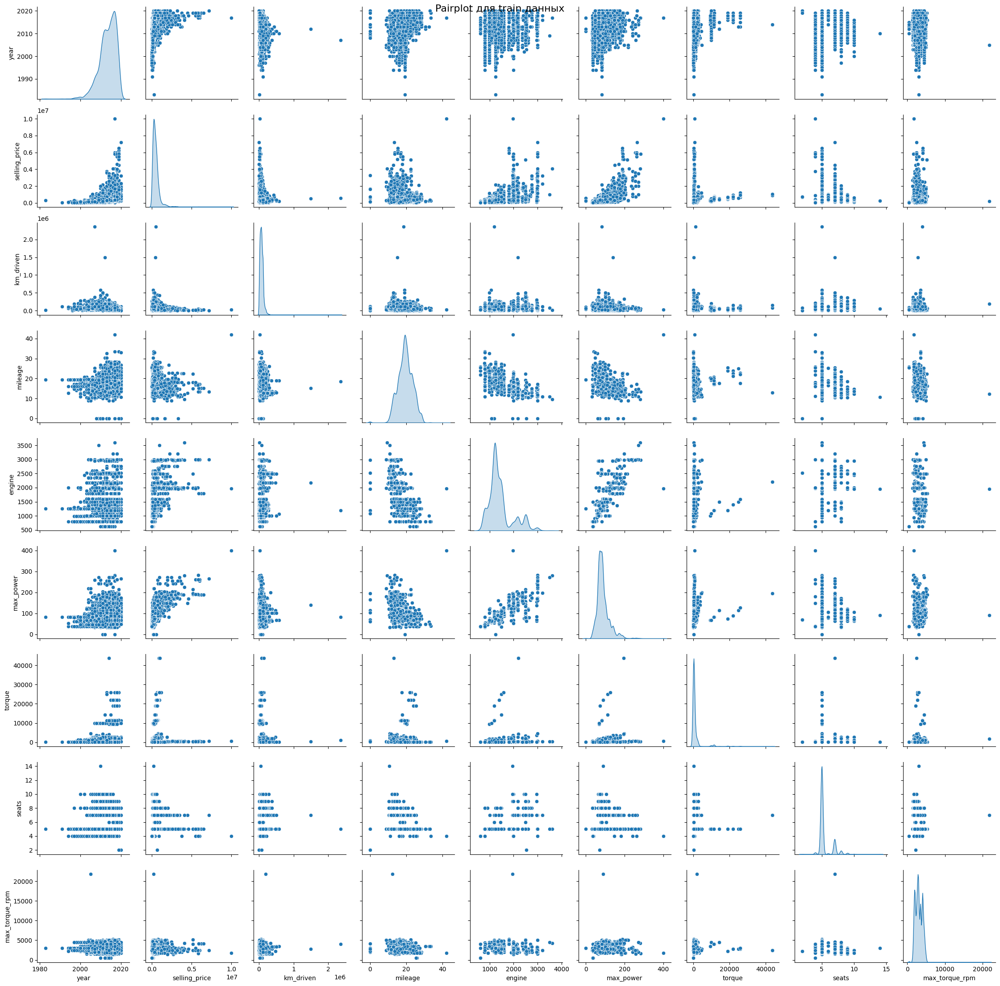

In [38]:
numeric_cols = df_train.select_dtypes(include=[np.number]).columns.tolist()

sns.pairplot(df_train[numeric_cols], diag_kind='kde')
plt.suptitle('Pairplot для train данных', fontsize=16)
plt.tight_layout()

1. **Можно ли предположить на основе распределений связь признаков с целевой переменной?**

Да, можно предположить наличие связи. По графикам видно, что:
- year и selling_price: более новые автомобили стоят дороже
- km_driven и selling_price: чем больше пробег, тем ниже цена
- engine, max_power, torque и selling_price: более мощные автомобили стоят дороже

2. **Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?**

Да, можно выдвинуть следующие гипотезы:
- engine, max_power - как будто есть положительная корреляция (в целом логично - эти признаки связаны с мощностью двигателя)
- year и km_driven - по графику не сильно видно, но возможная отрицательная корреляция (более новые автомобили обычно с меньшим пробегом)
- max_torque_rpm и torque - связаны с характеристиками двигателя


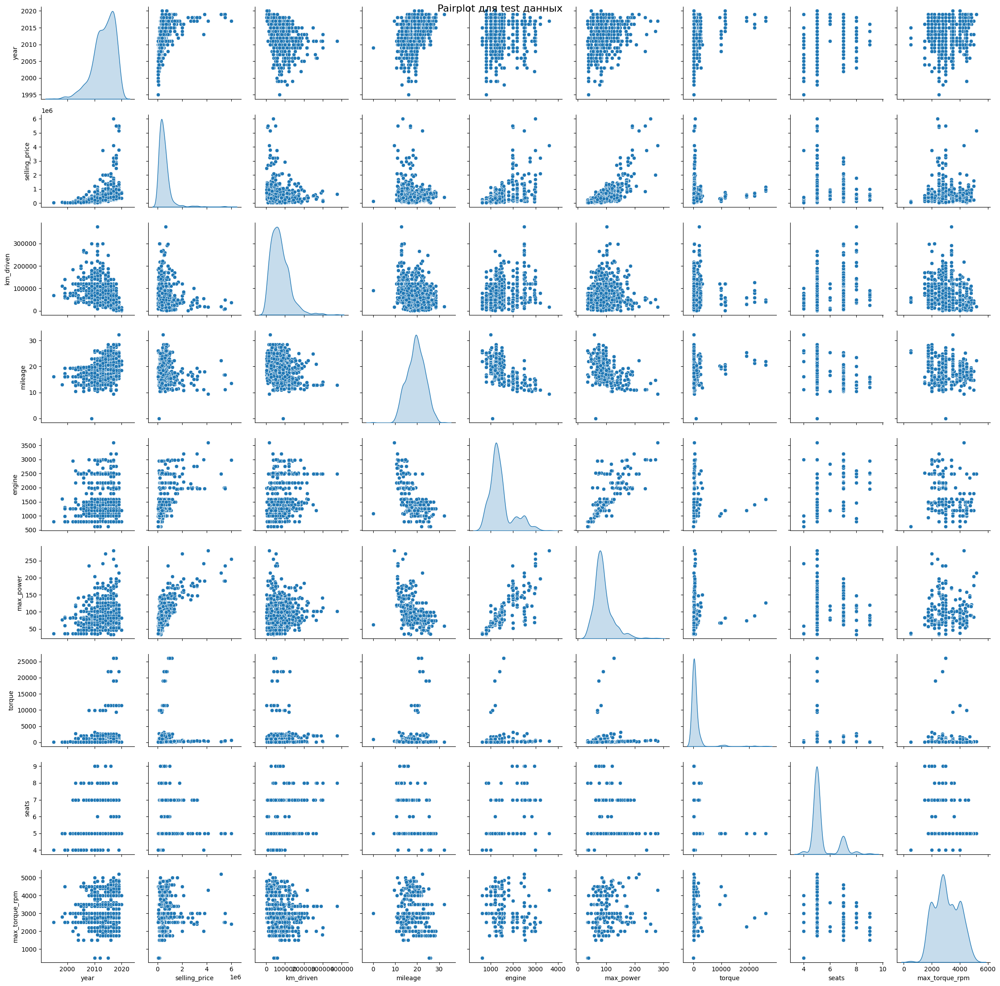

In [39]:
sns.pairplot(df_test[numeric_cols], diag_kind='kde')
plt.suptitle('Pairplot для test данных', fontsize=16)
plt.tight_layout()

**Похожими ли оказались совокупности при разделении на трейн и тест?**

Общая форма распределений похожа и сохраняются направления зависимостей

В km_driven видны различия в шкале значений, также небольшие различия в средних значениях и дисперсиях (уже было видно ранее в заданиях) и немного отличается кол-во выбросов в отдельных признаках

Но я бы сказала, что совокупности в целом похожи, так что модель, обученная на train, должна хорошо работать на test. Но все таки есть небольшие различия, может иметь место некоторый data drift, но он как будто не критичен для работы модели


### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

Матрица корреляций Пирсона:
                 year  selling_price  km_driven  mileage  engine  max_power  \
year            1.000          0.427     -0.369    0.341   0.003      0.157   
selling_price   0.427          1.000     -0.165   -0.105   0.448      0.693   
km_driven      -0.369         -0.165      1.000   -0.182   0.230      0.025   
mileage         0.341         -0.105     -0.182    1.000  -0.573     -0.373   
engine          0.003          0.448      0.230   -0.573   1.000      0.681   
max_power       0.157          0.693      0.025   -0.373   0.681      1.000   
torque          0.096          0.023     -0.048    0.022  -0.025      0.036   
seats           0.041          0.150      0.192   -0.451   0.652      0.244   
max_torque_rpm  0.050         -0.082     -0.199   -0.190  -0.233     -0.010   

                torque  seats  max_torque_rpm  
year             0.096  0.041           0.050  
selling_price    0.023  0.150          -0.082  
km_driven       -0.048  0.192        

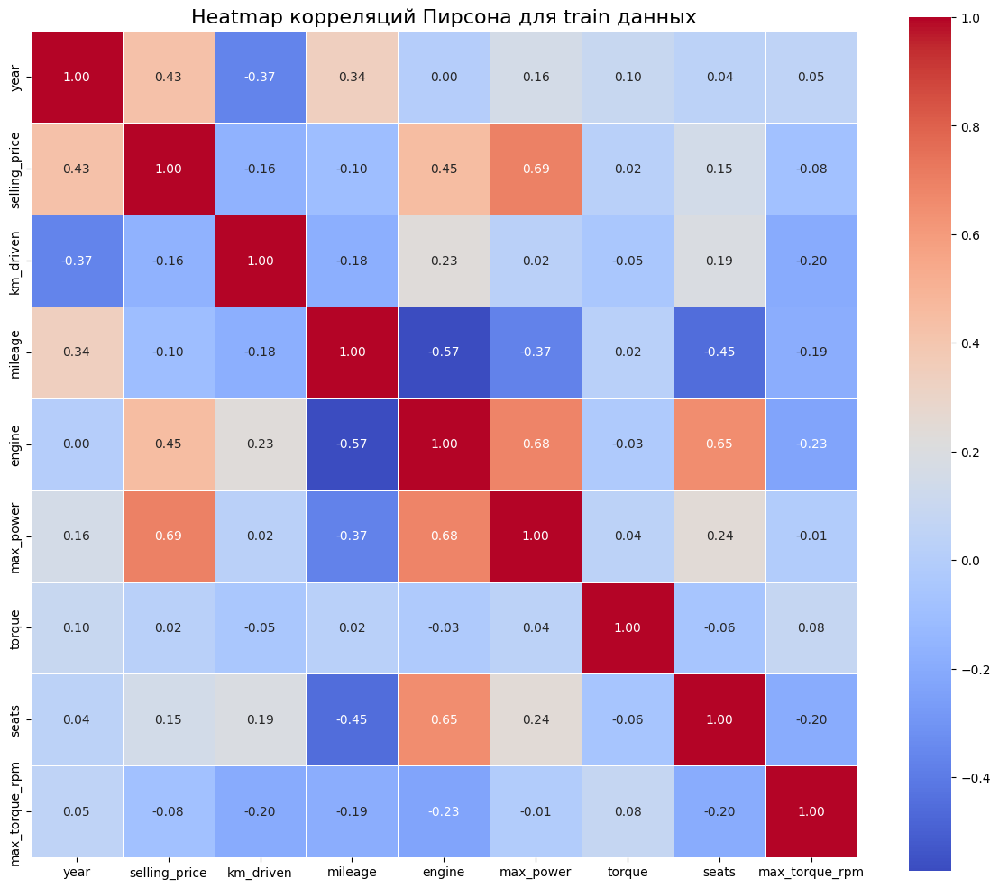

In [40]:
correlation_matrix = df_train[numeric_cols].corr()

print("Матрица корреляций Пирсона:")
print(correlation_matrix.round(3))

plt.figure(figsize=(12, 10))
sns.heatmap(
    correlation_matrix, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm', 
    square=True, 
    linewidths=0.5
)
plt.title('Heatmap корреляций Пирсона для train данных', fontsize=16)
plt.tight_layout()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

1. **Какие 2 признака наименее скоррелированы между собой?**

Enigine и year (коэффициент = 0 -> нет линейной корреляции)

2. **Между какими наблюдается довольно сильная положительная линейная зависимость?**

- max_power и selling_price (0.69) - то есть цена сильно зависит от мощности двигателя, логично
- engine и max_power (0.68) — объем двигателя и мощность
- engine и seats (0.65) — видимо больший объем двигателя часто соответствует большему количеству мест

3. **Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?**

Да, видно, что корреляция между year и km_driven отрицательная. Это логично - чем старше автомобиль, тем больше времени прошло с момента выпуска, и тем больше километров он успел проехать

4. **Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?**

По умолчанию `pd.corr()` использует коэффициент корреляции Пирсона (измеряет линейную зависимость, выдает значение от -1 до 1)

У `pd.corr()` есть параметр `method`:
- `'pearson'` (по умолчанию) - линейная корреляция Пирсона
- `'kendall'` - корреляция Кендалла
- `'spearman'` - корреляция Спирмена


### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [41]:
def spearman_correlation(x, y):
    """
    Корреляция Спирмена - это корреляция Пирсона, примененная к рангам
    
    Надо:
    1. Преобразовать значения в ранги
    2. Применить формулу Пирсона к рангам
    3. Обработать одинаковые значения (присваиваем средний ранг)
    """
    x = x[~np.isnan(x)]
    y = y[~np.isnan(y)]
    
    def get_ranks(arr):
        # argsort дважды даёт ранги от 0 до n-1
        raw_ranks = np.argsort(np.argsort(arr)) + 1
        
        unique_vals = np.unique(arr)
        ranks = raw_ranks.astype(float)

        for val in unique_vals:
            mask = (arr == val)
            if np.sum(mask) > 1:  # если значение встречается больше одного раза
                ranks[mask] = np.mean(ranks[mask]) # присваиваем средний ранг
        
        return ranks
    
    x_ranks = get_ranks(x)
    y_ranks = get_ranks(y)
    
    # формула Пирсона (к рангам)
    x_mean = np.mean(x_ranks)
    y_mean = np.mean(y_ranks)

    numerator = np.sum((x_ranks - x_mean) * (y_ranks - y_mean))
    denominator = np.sqrt(
        np.sum((x_ranks - x_mean) ** 2) * 
        np.sum((y_ranks - y_mean) ** 2)
    )
    
    if denominator == 0:
        return np.nan

    return numerator / denominator

spearman_matrix = pd.DataFrame(index=numeric_cols, columns=numeric_cols)

for col1 in df_train[numeric_cols]:
    for col2 in df_train[numeric_cols]:
        spearman_matrix.loc[col1, col2] = spearman_correlation(
            df_train[col1].values, 
            df_train[col2].values
        )

spearman_library = df_train[numeric_cols].corr(method='spearman')

diff = (spearman_matrix - spearman_library).abs()
print(f"Средняя разница: {diff.mean().mean():.5f}")

Средняя разница: 0.00000


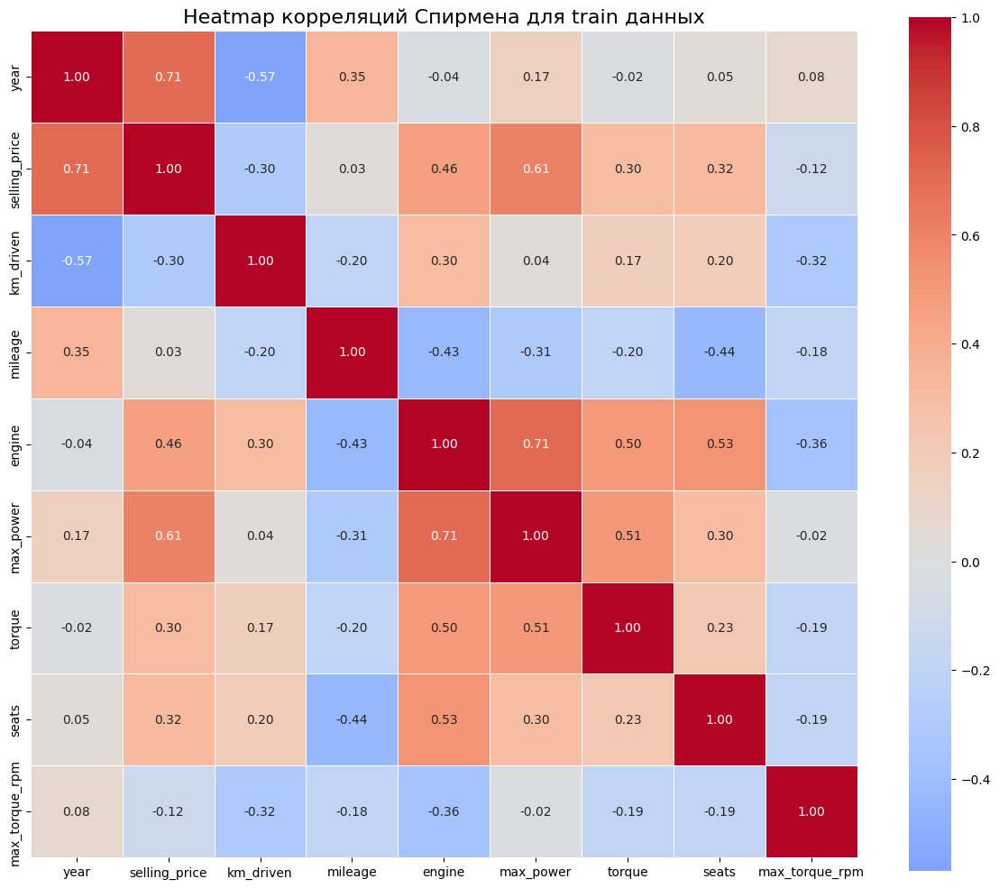

In [42]:
plt.figure(figsize=(12, 10))
sns.heatmap(
    spearman_library, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm', 
    center=0, 
    square=True, 
    linewidths=0.5
)
plt.title('Heatmap корреляций Спирмена для train данных', fontsize=16)
plt.tight_layout()

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


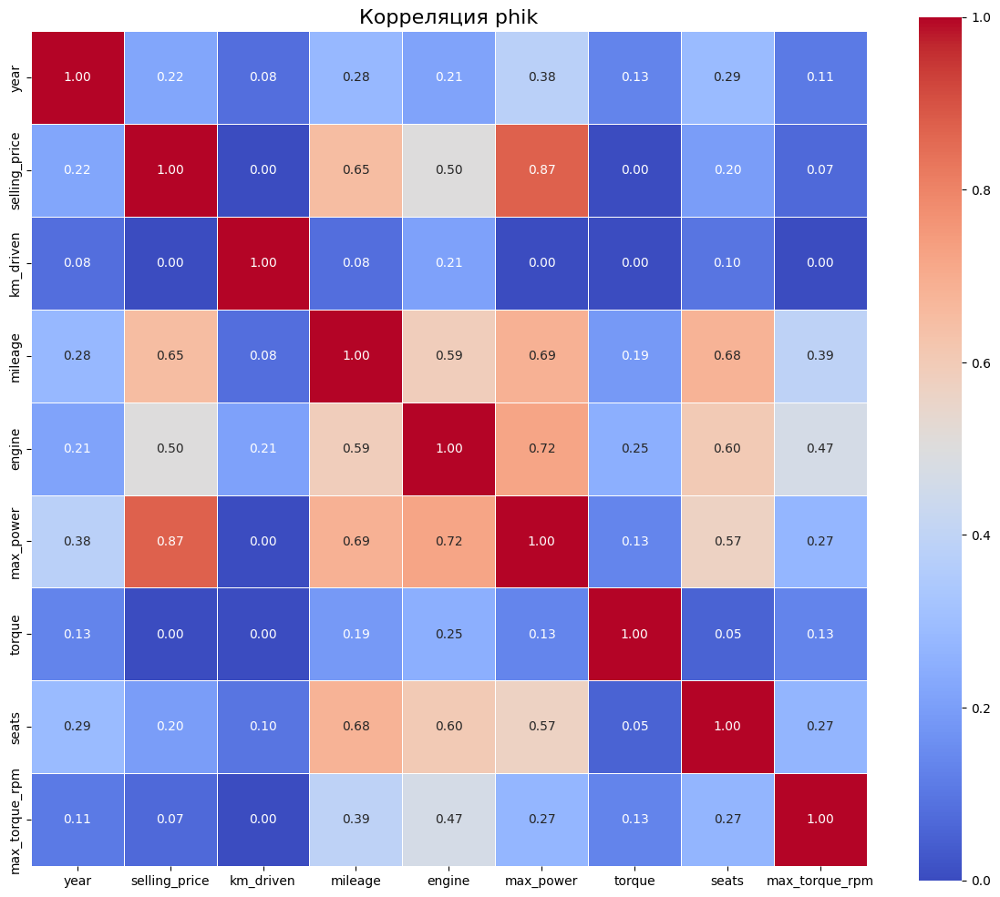

In [43]:
phik_result = phik_matrix(df_train[numeric_cols])

plt.figure(figsize=(12, 10))
sns.heatmap(
    phik_result, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm', 
    square=True,
    linewidths=0.5
)
plt.title('Корреляция phik', fontsize=16)
plt.tight_layout()

**Выводы:**

**1. Сравнение ручной и библиотечной реализации корреляции Спирмена:**

Результаты совпадают, с ручной реализацией все в порядке

**2. Сравнение корреляций Пирсона и Спирмена:**

Спирмен может обнаружить зависимости, даже если они нелинейные, поэтому у него выявлено больше корреляций между признаками

Если связь чисто линейная, значения Пирсона и Спирмена будут близки

После вычисления корреляции Спирмена в топ по корреляции выбилась пара selling_price - year, значит между ними есть сильная зависимость, но не совсем линейная

**3. Интерпретация матрицы phik:**

phik - это мера корреляции, которая обнаруживает нелинейные зависимости и работает как с числовыми, так и с категориальными переменными

В целом результаты схожи с матрицей Пирсона, но например между mileage и max_power неожиданно сильная положительная, видимо нелинейная, корреляция (0.69!), и между mileage и seats такая же ситуация

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

In [44]:
# Не успела сделать :(

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [45]:
df_train_numeric = df_train.select_dtypes(include=[np.number]).copy()

y_train = df_train_numeric['selling_price'].copy()
X_train = df_train_numeric.drop(columns=['selling_price']).copy()

In [46]:
df_test_numeric = df_test.select_dtypes(include=[np.number]).copy()

y_test = df_test_numeric['selling_price'].copy()
X_test = df_test_numeric.drop(columns=['selling_price']).copy()

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"X_train columns: {X_train.columns.tolist()}")
print(f"X_test columns: {X_test.columns.tolist()}")

X_train shape: (5840, 8)
X_test shape: (931, 8)
X_train columns: ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']
X_test columns: ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


Выбранные вещественные признаки:

- `year` - год выпуска автомобиля
- `km_driven` - пробег в километрах
- `mileage` - расход топлива
- `engine` - объем двигателя
- `max_power` - максимальная мощность 
- `torque` - крутящий момент 
- `seats` - количество мест
- `max_torque_rpm` - обороты при максимальном крутящем моменте

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [47]:
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

y_train_pred = linear_model.predict(X_train)
y_test_pred = linear_model.predict(X_test)

r2_train = r2_score(y_train, y_train_pred)
mse_train = MSE(y_train, y_train_pred)

r2_test = r2_score(y_test, y_test_pred)
mse_test = MSE(y_test, y_test_pred)

print("Метрики качества линейной регрессии:")

print("\nTrain set:")
print(f"R^2 = {r2_train:.4f}")
print(f"MSE = {mse_train:.2f}")

print("\nTest set:")
print(f"R^2 = {r2_test:.4f}")
print(f"MSE = {mse_test:.2f}")

Метрики качества линейной регрессии:

Train set:
R^2 = 0.6019
MSE = 114116256798.82

Test set:
R^2 = 0.6261
MSE = 133888852798.53


**Выводы:**

1. **R^2**
   - Показывает долю дисперсии целевой переменной, объясняемую моделью
   - На трейне примерно такое же значение, что и на тесте -> нет переобучения

2. **MSE**
   - MSE показывает большооое значение, потому что оно измеряется в квадаратах отклонений цен (в рупиях)
   - Опять таки результаты на трейне и тесте сопоставимы -> как минимум нет признаков переобучения, но качество модели пока такое себе


### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [48]:
def r2_score_by_hand(y_true, y_pred):
    """    
    Формула: R² = 1 - (SS_res / SS_tot)
    
    где:
    - SS_res = Σ(y_true - y_pred)²  (сумма квадратов остатков)
    - SS_tot = Σ(y_true - y_mean)²  (сумма квадратов отклонений от среднего)
    """
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    y_mean = np.mean(y_true)
    
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - y_mean) ** 2)
    
    if ss_tot == 0:
        return 0.0 if np.allclose(y_true, y_pred) else np.nan
    
    return 1  - (ss_res / ss_tot)


r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

r2_train_by_hand = r2_score_by_hand(y_train, y_train_pred)
r2_test_by_hand = r2_score_by_hand(y_test, y_test_pred)

assert np.allclose(r2_train_by_hand, r2_train, rtol=1e-10), "Результаты не совпадают для train"
assert np.allclose(r2_test_by_hand, r2_test, rtol=1e-10), "Результаты не совпадают для test"

**Формула**

$$R^2 = 1 - \frac{SS_{res}}{SS_{tot}}$$

- $SS_{res} = \sum_{i=1}^{n}(y_i - \hat{y}_i)^2$ — сумма квадратов остатков
- $SS_{tot} = \sum_{i=1}^{n}(y_i - \bar{y})^2$ — общая сумма квадратов
- $y_i$ — реальные значения целевой переменной
- $\hat{y}_i$ — предсказанные значения модели
- $\bar{y} = \frac{1}{n}\sum_{i=1}^{n}y_i$ — среднее значение целевой переменной
- $n$ — количество наблюдений

(LateX для формулы сгенерил Qwen)

**Объяснение**

1. $SS_{res}$ — сумма квадратов остатков - показывает, насколько предсказания модели отклоняются от реальных значений (чем меньше, тем модель точнее)

2. $SS_{tot}$ — общая сумма квадратов - это как бы базовая дисперсия, которую мы пытаемся объяснить моделью

Если бы мы всегда предсказывали среднее значение y, то $SS_{res} = SS_{tot}$

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [49]:
def adjusted_r2_score(y_true, y_pred, n_features):
    """
    Скорректированный коэффициент детерминации
    
    Формула: R^2_adj = 1 - (1 - R²) * (n - 1) / (n - p - 1)
    
    где:
    - R^2 - обычный коэффициент детерминации
    - n - количество наблюдений
    - p - количество признаков (features)
    """
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    n = len(y_true)    
    p = n_features
    
    # обычный R^2
    y_mean = np.mean(y_true)
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - y_mean) ** 2)
    
    if ss_tot == 0:
        return 0.0 if np.allclose(y_true, y_pred) else np.nan
    
    r2 = 1 - (ss_res / ss_tot)
    
    if n <= p + 1:
        return np.nan
    
    adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
    
    return adjusted_r2


n_features = X_train.shape[1]

adjusted_r2_train = adjusted_r2_score(y_train, y_train_pred, n_features)
adjusted_r2_test = adjusted_r2_score(y_test, y_test_pred, n_features)

print("Train set:")
print(f"  R^2:           {r2_train:.6f}")
print(f"  Adjusted-R^2:  {adjusted_r2_train:.6f}")
print(f"  Разница:      {r2_train - adjusted_r2_train:.6f}")

print("\nTest set:")
print(f"  R^2:           {r2_test:.6f}")
print(f"  Adjusted-R^2:  {adjusted_r2_test:.6f}")
print(f"  Разница:      {r2_test - adjusted_r2_test:.6f}")

Train set:
  R^2:           0.601881
  Adjusted-R^2:  0.601334
  Разница:      0.000546

Test set:
  R^2:           0.626088
  Adjusted-R^2:  0.622843
  Разница:      0.003244


**Формула скорректированного коэффициента детерминации**

$$R^2_{adj} = 1 - \frac{(1 - R^2)(n - 1)}{n - p - 1}$$

где:
- $R^2$ — обычный коэффициент детерминации
- $n$ — количество наблюдений
- $p$ — количество признаков (features) в модели

(Формула также от Qwen-а)

Обычный $R^2$ всегда увеличивается (или остается прежним) при добавлении новых признаков, даже если они неинформативны, а Adjusted-R^2 штрафует модель за большое количество признаков (то есть она как бы учитывает сложность модели)

Можно использовать Adjusted-R^2, когда сравниваются модели с разными кол-вом признаков, а обычный - когда количество признаков одинаково, или для интерпретации доли объясненной дисперсии

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [50]:
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)

print("\nПример статистик ДО стандартизации:")
print(X_train.iloc[:, :3].describe().round(2))
print("\nПример статистик ПОСЛЕ стандартизации:")
print(X_train_scaled.iloc[:, :3].describe().round(2))


Пример статистик ДО стандартизации:
          year   km_driven  mileage
count  5840.00     5840.00  5840.00
mean   2013.43    73952.24    19.43
std       4.10    60071.14     3.99
min    1983.00        1.00     0.00
25%    2011.00    39000.00    16.95
50%    2014.00    70000.00    19.37
75%    2017.00   100000.00    22.30
max    2020.00  2360457.00    42.00

Пример статистик ПОСЛЕ стандартизации:
          year  km_driven  mileage
count  5840.00    5840.00  5840.00
mean      0.00      -0.00    -0.00
std       1.00       1.00     1.00
min      -7.43      -1.23    -4.88
25%      -0.59      -0.58    -0.62
50%       0.14      -0.07    -0.02
75%       0.87       0.43     0.72
max       1.60      38.07     5.66


Сохраним для будущего streamlit-приложения

In [ ]:
with open("model/scaler.pkl", "wb") as f:
    pickle.dump(scaler, f)


In [52]:
# переобучаем модель на стандартизированных данных
linear_model_scaled = LinearRegression()
linear_model_scaled.fit(X_train_scaled, y_train)

y_train_pred = linear_model_scaled.predict(X_train_scaled)
y_test_pred = linear_model_scaled.predict(X_test_scaled)

r2_train = r2_score(y_train, y_train_pred)
mse_train = MSE(y_train, y_train_pred)

r2_test = r2_score(y_test, y_test_pred)
mse_test = MSE(y_test, y_test_pred)

print("\nTrain set:")
print(f"  R^2 = {r2_train:.4f}")
print(f"  MSE = {mse_train:.2f}")

print("\nTest set:")
print(f"  R^2 = {r2_test:.4f}")
print(f"  MSE = {mse_test:.2f}")


Train set:
  R^2 = 0.6019
  MSE = 114116256798.82

Test set:
  R^2 = 0.6261
  MSE = 133888852798.53


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [53]:
coefficients = linear_model_scaled.coef_
feature_names = X_train_scaled.columns

coef_df = pd.DataFrame({
    'feature': feature_names,
    'coef': coefficients,
    'abs_coef': np.abs(coefficients)
})

coef_df = coef_df.sort_values('abs_coef', ascending=False)

print("Важность признаков в модели (по модулю коэффициента):")
print(coef_df.to_string(index=False))

most_important = coef_df.iloc[0]
print(f"\nНаиболее информативный признак:\n{most_important['feature']}")
print(f"coef: {most_important['coef']:.4f}")
print(f"|coef|: {most_important['abs_coef']:.4f}")

Важность признаков в модели (по модулю коэффициента):
       feature          coef      abs_coef
     max_power 334084.094059 334084.094059
          year 166825.965402 166825.965402
max_torque_rpm -59656.671495  59656.671495
     km_driven -48593.369653  48593.369653
         seats -30585.686311  30585.686311
        engine  23729.616958  23729.616958
        torque -14490.253490  14490.253490
       mileage  -8335.954907   8335.954907

Наиболее информативный признак:
max_power
coef: 334084.0941
|coef|: 334084.0941


### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [54]:
lasso_model = Lasso()
lasso_model.fit(X_train_scaled, y_train)

y_train_pred_lasso = lasso_model.predict(X_train_scaled)
y_test_pred_lasso = lasso_model.predict(X_test_scaled)

r2_train_lasso = r2_score(y_train, y_train_pred_lasso)
mse_train_lasso = MSE(y_train, y_train_pred_lasso)

r2_test_lasso = r2_score(y_test, y_test_pred_lasso)
mse_test_lasso = MSE(y_test, y_test_pred_lasso)

print("\nTrain set:")
print(f"  R^2 = {r2_train_lasso:.4f}")
print(f"  MSE = {mse_train_lasso:.2f}")

print("\nTest set:")
print(f"  R^2 = {r2_test_lasso:.4f}")
print(f"  MSE = {mse_test_lasso:.2f}")


Train set:
  R^2 = 0.6019
  MSE = 114116256813.68

Test set:
  R^2 = 0.6261
  MSE = 133889157711.94


In [55]:
# проверяем, какие веса занулились
coefficients_lasso = lasso_model.coef_
feature_names = X_train_scaled.columns

coef_lasso_df = pd.DataFrame({
    'feature': feature_names,
    'coef': coefficients_lasso,
    'abs_coef': np.abs(coefficients_lasso),
    'zeroed': coefficients_lasso == 0
})

coef_lasso_df = coef_lasso_df.sort_values('abs_coef', ascending=False)

print(coef_lasso_df.to_string(index=False))

n_zeroed = coef_lasso_df['zeroed'].sum()
n_total = len(coef_lasso_df)

print(f"\nКоличество зануленных признаков: {n_zeroed} из {n_total}")
print(f"Процент зануленных признаков: {n_zeroed/n_total*100:.3f}%")

if n_zeroed > 0:
    print("\nЗануленные признаки:")
    zeroed_features = coef_lasso_df[coef_lasso_df['zeroed']['feature'].tolist()]
    print(zeroed_features)

       feature          coef      abs_coef  zeroed
     max_power 334085.103776 334085.103776   False
          year 166823.663389 166823.663389   False
max_torque_rpm -59654.547946  59654.547946   False
     km_driven -48592.450767  48592.450767   False
         seats -30581.661700  30581.661700   False
        engine  23727.481631  23727.481631   False
        torque -14489.078943  14489.078943   False
       mileage  -8332.679924   8332.679924   False

Количество зануленных признаков: 0 из 8
Процент зануленных признаков: 0.000%


Никакие веса не занулились с дефолтными параметрами

Мои предположения почему:

- В нашем датасете относительно небольшое количество признаков и все они имеют достаточный вклад в предсказание цены, то есть каждый признак содержит уникальную информацию

- Дефолтный параметр alpha=1.0 недостаточно велик

- Также после стандартизации все признаки имеют одинаковый масштаб (среднее=0, std=1) -> все признаки как бы равноправны


### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [56]:
param_grid_lasso = {
    'alpha': [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 50.0, 100.0]
}
lasso = Lasso()

grid_search_lasso = GridSearchCV(
    estimator=lasso,
    param_grid=param_grid_lasso,
    scoring='r2',
    cv=10,
    n_jobs=-1,
    verbose=1
)

print(f"Сетка параметров: {param_grid_lasso}")
print(f"Количество комбинаций: {len(param_grid_lasso['alpha'])}")
print("Количество фолдов: 10")
print(f"Всего моделей будет обучено: {len(param_grid_lasso['alpha']) * 10}")

grid_search_lasso.fit(X_train_scaled, y_train)


print(f"\nЛучшие параметры: {grid_search_lasso.best_params_}")
print(f"Лучший R^2 (кросс-валидация): {grid_search_lasso.best_score_:.4f}")

Сетка параметров: {'alpha': [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 50.0, 100.0]}
Количество комбинаций: 10
Количество фолдов: 10
Всего моделей будет обучено: 100
Fitting 10 folds for each of 10 candidates, totalling 100 fits

Лучшие параметры: {'alpha': 100.0}
Лучший R^2 (кросс-валидация): 0.5761


In [57]:
best_lasso = grid_search_lasso.best_estimator_
y_train_pred_best = best_lasso.predict(X_train_scaled)
y_test_pred_best = best_lasso.predict(X_test_scaled)

r2_train_best = r2_score(y_train, y_train_pred_best)
mse_train_best = MSE(y_train, y_train_pred_best)
r2_test_best = r2_score(y_test, y_test_pred_best)
mse_test_best = MSE(y_test, y_test_pred_best)

print("Метрики лучшей модели Lasso на train и test:")
print("Train set:")
print(f"  R^2 = {r2_train_best:.4f}")
print(f"  MSE = {mse_train_best:.2f}")

print("\nTest set:")
print(f"  R^2 = {r2_test_best:.4f}")
print(f"  MSE = {mse_test_best:.2f}")

Метрики лучшей модели Lasso на train и test:
Train set:
  R^2 = 0.6019
  MSE = 114116409462.56

Test set:
  R^2 = 0.6260
  MSE = 133919825237.97


In [58]:
coefficients_best = best_lasso.coef_
coef_best_df = pd.DataFrame({
    'feature': X_train_scaled.columns,
    'coef': coefficients_best,
    'abs_coef': np.abs(coefficients_best),
    'zeroed': coefficients_best == 0
})

coef_best_df = coef_best_df.sort_values('abs_coef', ascending=False)

n_zeroed_best = coef_best_df['zeroed'].sum()
print(f"\nКоличество зануленных признаков в лучшей модели: {n_zeroed_best} из {len(coef_best_df)}")

if n_zeroed_best > 0:
    print("Зануленные признаки:")
    print(coef_best_df[coef_best_df['zeroed']['feature'].tolist()])


Количество зануленных признаков в лучшей модели: 0 из 8


1. Грид-серчу пришлось обучить 100 моделей

2. В `param_grid_lasso` был только один параметр:

- `alpha` (коэффициент регуляризации):
  - контролирует силу L1-регуляризации в Lasso
  - чем больше alpha, тем сильнее штраф за большие коэффициенты

3. Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

- лучший alpha = 100
- количество зануленных признаков = 0


**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [59]:
param_grid_elastic = {
    'alpha': [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0],  # коэффициент регуляризации
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]  # соотношение L1 / L2
}
elastic_net = ElasticNet(max_iter=10000)

grid_search_elastic = GridSearchCV(
    estimator=elastic_net,
    param_grid=param_grid_elastic,
    scoring='r2',
    cv=10,
    n_jobs=-1,
    verbose=1
)

In [60]:
print("Сетка параметров:")
print(f"  alpha: {param_grid_elastic['alpha']}")
print(f"  l1_ratio: {param_grid_elastic['l1_ratio']}")
print(f"Количество комбинаций: {len(param_grid_elastic['alpha']) * len(param_grid_elastic['l1_ratio'])}")
print("Количество фолдов: 10")

total_models = len(param_grid_elastic['alpha']) * len(param_grid_elastic['l1_ratio']) * 10
print(f"Всего моделей будет обучено: {total_models}")

Сетка параметров:
  alpha: [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
  l1_ratio: [0.1, 0.3, 0.5, 0.7, 0.9]
Количество комбинаций: 40
Количество фолдов: 10
Всего моделей будет обучено: 400


In [61]:
grid_search_elastic.fit(X_train_scaled, y_train)

print(f"\nЛучшие параметры: {grid_search_elastic.best_params_}")
print(f"Лучший R^2 (кросс-валидация): {grid_search_elastic.best_score_:.4f}")

best_elastic = grid_search_elastic.best_estimator_
y_train_pred_elastic = best_elastic.predict(X_train_scaled)
y_test_pred_elastic = best_elastic.predict(X_test_scaled)

r2_train_elastic = r2_score(y_train, y_train_pred_elastic)
mse_train_elastic = MSE(y_train, y_train_pred_elastic)
r2_test_elastic = r2_score(y_test, y_test_pred_elastic)
mse_test_elastic = MSE(y_test, y_test_pred_elastic)

print("Train set:")
print(f"  R^2 = {r2_train_elastic:.4f}")
print(f"  MSE = {mse_train_elastic:.2f}")

print("\nTest set:")
print(f"  R^2 = {r2_test_elastic:.4f}")
print(f"  MSE = {mse_test_elastic:.2f}")

coefficients_elastic = best_elastic.coef_
coef_elastic_df = pd.DataFrame({
    'feature': X_train_scaled.columns,
    'coef': coefficients_elastic,
    'abs_coef': np.abs(coefficients_elastic),
    'zeroed': coefficients_elastic == 0
})

coef_elastic_df = coef_elastic_df.sort_values('abs_coef', ascending=False)

n_zeroed_elastic = coef_elastic_df['zeroed'].sum()
print(f"\nКоличество зануленных признаков в лучшей модели: {n_zeroed_elastic} из {len(coef_elastic_df)}")

Fitting 10 folds for each of 40 candidates, totalling 400 fits

Лучшие параметры: {'alpha': 0.5, 'l1_ratio': 0.7}
Лучший R^2 (кросс-валидация): 0.5837
Train set:
  R^2 = 0.5926
  MSE = 116774036285.74

Test set:
  R^2 = 0.6046
  MSE = 141582317132.52

Количество зануленных признаков в лучшей модели: 0 из 8


1. Всего было обучено 400 моделей

2. Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

- `alpha` = 0.5
- `l1_ratio` = 0.7 (то есть ближе к L2)


### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [62]:
# может успею сделать

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [63]:
print("Категориальные столбцы:", df_train.select_dtypes(include=['object']).columns.to_list())

Категориальные столбцы: ['name', 'fuel', 'seller_type', 'transmission', 'owner']


In [64]:
print(f"Количество уникальных значений: {df_train['name'].nunique()}")
print("Примеры значений:")

name_examples = df_train['name'].head(10).tolist()
for name in name_examples:
    print(name)

Количество уникальных значений: 1924
Примеры значений:
Maruti Swift Dzire VDI
Skoda Rapid 1.5 TDI Ambition
Hyundai i20 Sportz Diesel
Maruti Swift VXI BSIII
Hyundai Xcent 1.2 VTVT E Plus
Maruti Wagon R LXI DUO BSIII
Maruti 800 DX BSII
Toyota Etios VXD
Ford Figo Diesel Celebration Edition
Renault Duster 110PS Diesel RxL


Видно, что в каждом из семплов содержится много категорий (марка авто, модель авто, тип двигателя и т.д.)

Давайте попробуем извлечь несколько категорий

In [65]:
def extract_brand(sample: str):    
    if not pd.isna(sample) and len(str(sample).split()):
        return str(sample).split()[0]
    else:
        return 'unk'

df_train['brand'] = df_train['name'].apply(extract_brand)
df_train['brand'].value_counts()

brand
Maruti           1804
Hyundai          1058
Mahindra          611
Tata              534
Toyota            309
Ford              308
Honda             308
Chevrolet         188
Renault           171
Volkswagen        153
Nissan             63
Skoda              61
Datsun             49
Mercedes-Benz      44
BMW                41
Fiat               39
Audi               31
Jeep               20
Mitsubishi          8
Volvo               8
Jaguar              7
Force               4
Isuzu               4
Land                3
MG                  3
Daewoo              3
Kia                 3
Ambassador          3
Lexus               1
Peugeot             1
Name: count, dtype: int64

In [66]:
df_train[df_train['brand'] == 'unk'].shape

(0, 15)

Кажется, марку достали успешно! Пойдем дальше - извлечем модель

In [67]:
models = [
    "i20", "City", "Spark", "Scorpio", "Figo Aspire", "Swift Dzire", "Amaze",
    "Innova", "Terrano", "Grand i10", "SX4", "Cruze", "Bolt", "Linea", "Manza",
    "Wagon R", "Safari", "Alto", "800", "Ertiga", "Baleno", "Celerio"
]

def extract_model(sample: str):
    if not pd.isna(sample):
        name = str(sample).lower()
        for m in models:
            if m.lower() in name:
                return m
    else:
        return 'unk'

df_train['model'] = df_train['name'].apply(extract_model)
df_train['model'].value_counts()

model
Alto           319
Swift Dzire    284
i20            273
Wagon R        205
Innova         160
City           141
Grand i10      129
Scorpio        128
Ertiga         113
800             70
Baleno          66
Safari          63
Amaze           53
Celerio         49
Manza           40
Spark           39
SX4             35
Figo Aspire     29
Terrano         20
Linea           12
Cruze           12
Bolt             8
Name: count, dtype: int64

Модель тоже, во все попали (выделить названия моделей я попросила Gemini)

Далее тип двигателя, он может быть как-то связан с fuel? Проверим

In [68]:
df_train['fuel'].value_counts()

fuel
Diesel    3177
Petrol    2579
CNG         50
LPG         34
Name: count, dtype: int64

Да, в целом это и есть тип двигателя, поэтому можно использовать fuel для лучшего извлечения типа двигателя

In [69]:
diesel_keywords = ['crdi', 'idtec', 'dicor', 'm2di', 'diesel', 'zdi', 'ddis']
cng_keywords = ['cng']
petrol_keywords = ['vtec', 'revotron', 'kappa', 'safire']
lpg_keywords = ['LPG']
electric_keywords = ['Electric', 'EV', 'Hybrid', 'HEV', 'PHEV']

def extract_engine_type(sample: str, fuel: str):
    if pd.isna(sample):
        return 'Unknown'
    
    name_str = str(sample).lower()

    if any(word.lower() in name_str for word in diesel_keywords):
        return 'Diesel'
    elif any(word.lower() in name_str for word in petrol_keywords):
        return 'Petrol'
    elif any(word.lower() in name_str for word in cng_keywords):
        return 'CNG'
    elif any(word.lower() in name_str for word in lpg_keywords):
        return 'LPG'
    elif any(word.lower() in name_str for word in electric_keywords):
        return 'Electric'

    if fuel is not None and not pd.isna(fuel):
        fuel_str = str(fuel).lower()

        if 'diesel' in fuel_str:
            return 'Diesel'
        elif 'petrol' in fuel_str:
            return 'Petrol'
        elif 'cng' in fuel_str:
            return 'CNG'
        elif 'lpg' in fuel_str:
            return 'LPG'
    
    return 'unk'
    
    
df_train['name_engine_type'] = df_train.apply(
    lambda row: extract_engine_type(
        row['name'], 
        row.get('fuel', None)
    ), 
    axis=1
)

df_train['name_engine_type'].value_counts()

name_engine_type
Diesel      3065
Petrol      2487
Electric     201
CNG           53
LPG           34
Name: count, dtype: int64

Интересно, почти полное совпадение с fuel-фичей! 

Но я добавила тип Electric (кстати, по совету Gemini, я не разбираюсь в предметной области немного...) и он чуть-чуть изменил кол-во категорий

Давайте проверим, сколько фичей мы вообще уже ТОЧНО достали?

In [70]:
df_train.select_dtypes(include=['object']).shape

(5840, 8)

Какую еще фичу можно достать?

In [71]:
df_train['name'].tail(20)

5820                   Hyundai Verna 1.6 SX CRDi (O)
5821                            Maruti Swift 1.3 VXi
5822                       Honda City 2017-2020 VTEC
5823                              Honda City 1.3 EXI
5824             Renault Duster 85PS Diesel RxL Plus
5825                        Kia Seltos HTX Plus AT D
5826        Ford Freestyle Titanium Plus Diesel BSIV
5827                              Maruti Celerio VXI
5828                      Toyota Etios Cross 1.4L GD
5829    Toyota Innova 2.5 GX (Diesel) 8 Seater BS IV
5830                                 Maruti Alto LXi
5831                                   Maruti 800 AC
5832                      Maruti Alto K10 VXI Airbag
5833                               Hyundai i20 Magna
5834                     Maruti Wagon R LXI Optional
5835                         Hyundai Santro Xing GLS
5836               Maruti Wagon R VXI BS IV with ABS
5837                               Hyundai i20 Magna
5838                           Hyundai Verna C

Вижу `with ABS`, `Airbag`, `Optional` - давайте попробуем достать подобные опции

In [72]:
df_train['has_abs'] = df_train['name'].str.contains(r'\bABS\b', case=False)
df_train['has_abs'].value_counts()

has_abs
False    5746
True       94
Name: count, dtype: int64

In [73]:
df_train['has_airbag'] = df_train['name'].str.lower().str.contains('airbag|asta|vxi|zxi|sx', case=False)
df_train['has_airbag'].value_counts()

has_airbag
False    4944
True      896
Name: count, dtype: int64

Airbag уже лучше, пока оставим

In [74]:
df_train['is_luxury'] = df_train['name'].str.lower().str.contains('luxury|premium|top|vxi|zxi|sx|vx|zx|vdi|vvt', case=False, na=False)
df_train['is_luxury'].value_counts()

is_luxury
False    4508
True     1332
Name: count, dtype: int64

In [75]:
df_train['is_bs4'] = df_train['name'].str.lower().str.contains('bs ?iv|bsiv', case=False)
df_train['is_bs4'].value_counts()


is_bs4
False    5193
True      647
Name: count, dtype: int64

BS4 тоже неплохо!

Попробуем еще добавить фичу через маппинг `модель - сегмент`, как будто это может помочь модельке лучше понять формат машины (и я уже просто не знаю, откуда 11 фич наскребсти в сумме...)

In [76]:
def extract_segment(row):
    name = str(row.get('name', '')).lower()
    engine = row.get('engine', 0)
    max_power = row.get('max_power', 0)
    seats = row.get('seats', 5)
    
    suv_keywords = ['suv', 'scorpio', 'safari', 'terrano', 'fortuner', 'endeavour', 'xuv', 'duster']
    if any(kw in name for kw in suv_keywords):
        return 'SUV'
    
    if seats > 7:
        return 'MPV'
    
    if max_power > 150 and engine > 2000:
        return 'Luxury'
    
    if engine > 2000 or max_power > 120:
        return 'Full-size'
    
    if engine < 1000 and max_power < 60:
        return 'Compact'
    
    if engine >= 1000 and engine <= 2000:
        return 'Mid-size'
    
    return 'Standard'

df_train['segment'] = df_train.apply(extract_segment, axis=1)
df_train['segment'].value_counts()

segment
Mid-size     3527
Full-size     589
Compact       530
Standard      433
SUV           431
MPV           214
Luxury        116
Name: count, dtype: int64

Проделаем все то же самое с тестом и оформим в функцию все, что только что собрали

In [77]:
def extract_categorical_features(df):
    df['brand'] = df['name'].apply(extract_brand)
    df['model'] = df['name'].apply(extract_model)
    df['name_engine_type'] = df.apply(
        lambda row: extract_engine_type(
            row['name'], 
            row.get('fuel', None)
        ), 
        axis=1
    )
    df['segment'] = df.apply(extract_segment, axis=1)
    df['is_luxury'] = df['name'].str.lower().str.contains('luxury|premium|top|vxi|zxi|sx|vx|zx|vdi|vvt', case=False, na=False)
    df['has_airbag'] = df['name'].str.lower().str.contains('airbag|asta|vxi|zxi|sx', case=False)
    df['has_abs'] = df['name'].str.contains(r'\bABS\b', case=False)
    df['is_bs4'] = df['name'].str.lower().str.contains('bs ?iv|bsiv', case=False)

    return df

df_test = extract_categorical_features(df_test)

In [78]:
categorical_features = ['brand', 'model', 'name_engine_type', 'segment', 'seats', 'fuel', 'transmission', 'has_airbag', 'is_bs4', 'has_abs', 'is_luxury']

X_train_cat, y_train_cat = df_train[categorical_features], df_train['selling_price']
X_test_cat, y_test_cat = df_test[categorical_features], df_test['selling_price']

In [79]:
assert X_train_cat.shape == (5840, 11)

In [80]:
X_train_cat.describe(include='object')

,brand,model,name_engine_type,segment,fuel,transmission
count,5840,2248,5840,5840,5840,5840
unique,30,22,5,7,4,2
top,Maruti,Alto,Diesel,Mid-size,Diesel,Manual
freq,1804,319,3065,3527,3177,5336


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [81]:
# handle_unknown='ignore' - чтобы не было ошибок при наличии категории только в трейне 
# (например, такое есть среди моделей авто)
ohe = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')

# обучаем энкодер только на тренировочных данных
ohe.fit(X_train_cat)

X_train_cat_encoded = ohe.transform(X_train_cat)
X_test_cat_encoded = ohe.transform(X_test_cat)

feature_names = ohe.get_feature_names_out(X_train_cat.columns)

X_train_cat_encoded = pd.DataFrame(
    X_train_cat_encoded, 
    columns=feature_names, 
    index=X_train_cat.index
)
X_test_cat_encoded = pd.DataFrame(
    X_test_cat_encoded, 
    columns=feature_names, 
    index=X_test_cat.index
)

print(f"Форма данных до кодирования (train): {X_train_cat.shape}")
print(f"Форма данных после кодирования (train): {X_train_cat_encoded.shape}")
print("\nПримеры названий новых признаков:")
print(X_train_cat_encoded.columns[:10].tolist())



Форма данных до кодирования (train): (5840, 11)
Форма данных после кодирования (train): (5840, 77)

Примеры названий новых признаков:
['brand_Audi', 'brand_BMW', 'brand_Chevrolet', 'brand_Daewoo', 'brand_Datsun', 'brand_Fiat', 'brand_Force', 'brand_Ford', 'brand_Honda', 'brand_Hyundai']


/Users/yavolkova/Documents/.venv_ml/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:261: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


In [ ]:
with open('models/ohe.pkl', 'wb') as f:
    pickle.dump(ohe, f)

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

- Для корректной работы надо, во-первых, обучать ТОЛЬКО на трейне во избежание утечки данных, и во-вторых, использовать одинаковые категории для трейна и теста (я обрабатывалаа через handle_unknown) + удалять один столбец

- Зачем удалять один столбец? Во избежание мультиколлиенарности между категориями (сумма всех столбцов будет равна 1, т.к. один объект принадлежит только одной категории) -> матрица признаков становится вырожденной и мы не сможем посчитать обратную матрицу (там деление на детерминант)


- Нет, мы будем делать вывод о важности через веса, которые были получены в процессе обучения модели и, в общем-то, зависят от тетсовых данных -> опять лик данных

    По-хорошему отбор признаков должен проводиться ДО обучения финальной модели или через кросс-валидацию 

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [83]:
param_grid_ridge = {
    'alpha': [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 50.0, 100.0, 500.0, 1000.0]
}

ridge = Ridge()

grid_search_ridge = GridSearchCV(
    estimator=ridge,
    param_grid=param_grid_ridge,
    scoring='r2',
    cv=10,
    n_jobs=-1,
    verbose=1
)

print(f"Сетка параметров: {param_grid_ridge}")
print(f"Количество комбинаций: {len(param_grid_ridge['alpha'])}")
print(f"Всего моделей будет обучено: {len(param_grid_ridge['alpha']) * 10}")

Сетка параметров: {'alpha': [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 50.0, 100.0, 500.0, 1000.0]}
Количество комбинаций: 12
Всего моделей будет обучено: 120


In [84]:
X_train_combined = pd.concat([X_train_scaled, X_train_cat_encoded], axis=1)
X_test_combined = pd.concat([X_test_scaled, X_test_cat_encoded], axis=1)

print(f"Всего признаков: {X_train_combined.shape[1]} (вещественные: {X_train_scaled.shape[1]}, категориальные: {X_train_cat_encoded.shape[1]})")

grid_search_ridge.fit(X_train_combined, y_train_cat)

print(f"\nЛучшие параметры: {grid_search_ridge.best_params_}")
print(f"Лучший R^2 (кросс-валидация): {grid_search_ridge.best_score_:.4f}")

Всего признаков: 85 (вещественные: 8, категориальные: 77)
Fitting 10 folds for each of 12 candidates, totalling 120 fits

Лучшие параметры: {'alpha': 2.0}
Лучший R^2 (кросс-валидация): 0.7116


In [85]:
best_ridge = grid_search_ridge.best_estimator_

y_train_pred_ridge = best_ridge.predict(X_train_combined)
y_test_pred_ridge = best_ridge.predict(X_test_combined)

r2_train_ridge = r2_score(y_train_cat, y_train_pred_ridge)
mse_train_ridge = MSE(y_train_cat, y_train_pred_ridge)

r2_test_ridge = r2_score(y_test_cat, y_test_pred_ridge)
mse_test_ridge = MSE(y_test_cat, y_test_pred_ridge)

print("\nМетрики лучшей Ridge на объединенных признаках (вещественные + категориальные):")
print("Train set:")
print(f"  R^2 = {r2_train_ridge:.4f}")
print(f"  MSE = {mse_train_ridge:.2f}")

print("\nTest set:")
print(f"  R^2 = {r2_test_ridge:.4f}")
print(f"  MSE = {mse_test_ridge:.2f}")


Метрики лучшей Ridge на объединенных признаках (вещественные + категориальные):
Train set:
  R^2 = 0.7552
  MSE = 70182668078.04

Test set:
  R^2 = 0.7800
  MSE = 78772097647.00


Удалось улучшить качество прогнозов: R^2 с 0.6-0.63 вырос до 0.78 с довольно очевидными признаками, думаю можно придумать еще более качественные признаки и добиться лучшего качества

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [86]:
# your code here

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [87]:
def business_metric(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    y_true = y_true[y_true > 0]
    y_pred = y_pred[y_true > 0]
    
    relative_error = np.abs(y_pred - y_true) / y_true
    # проверяем, какие прогнозы находятся в пределах 10%
    within_10_percent = relative_error <= 0.1
    
    return np.mean(within_10_percent)


results = []

y_train_pred_lr = linear_model_scaled.predict(X_train_scaled)
y_test_pred_lr = linear_model_scaled.predict(X_test_scaled)

train_metric_lr = business_metric(y_train, y_train_pred_lr)
test_metric_lr = business_metric(y_test, y_test_pred_lr)

results.append({
    'model': 'linear regression (scaled)',
    'train': train_metric_lr,
    'test': test_metric_lr
})

train_metric_lasso = business_metric(y_train, y_train_pred_lasso)
test_metric_lasso = business_metric(y_test, y_test_pred_lasso)
    
results.append({
    'model': 'lasso (default)',
    'train': train_metric_lasso,
    'test': test_metric_lasso
})

train_metric_best_lasso = business_metric(y_train, y_train_pred_best)
test_metric_best_lasso = business_metric(y_test, y_test_pred_best)
    
results.append({
    'model': 'lasso (best, alpha=100.0)',
    'train': train_metric_best_lasso,
    'test': test_metric_best_lasso
})
train_metric_elastic = business_metric(y_train, y_train_pred_elastic)
test_metric_elastic = business_metric(y_test, y_test_pred_elastic)

results.append({
    'model': 'elasticNet (best, alpha=0.5, l1_ratio=0.7)',
    'train': train_metric_elastic,
    'test': test_metric_elastic
})

train_metric_ridge = business_metric(y_train_cat, y_train_pred_ridge)
test_metric_ridge = business_metric(y_test_cat, y_test_pred_ridge)

results.append({
    'model': 'ridge (best, alpha=2.0, with categorical)',
    'train': train_metric_ridge,
    'test': test_metric_ridge
})


results_df = pd.DataFrame(results)
results_df = results_df.sort_values('test', ascending=False)
print("\n", results_df.to_string(index=False))


                                      model    train     test
 ridge (best, alpha=2.0, with categorical) 0.282192 0.294307
elasticNet (best, alpha=0.5, l1_ratio=0.7) 0.228938 0.247046
                linear regression (scaled) 0.218664 0.237379
                           lasso (default) 0.218664 0.237379
                 lasso (best, alpha=100.0) 0.218836 0.237379


In [88]:
best_model = results_df.loc[results_df['test'].idxmax()]

print(f"Лучшая модель: {best_model['model']}")
print(f"Метрика на тесте: {best_model['test']:.4f} ({best_model['test']*100:.2f}%)")
print(f"Это означает, что {best_model['test']*100:.2f}% прогнозов находятся в пределах 10% от реальной цены")

Лучшая модель: ridge (best, alpha=2.0, with categorical)
Метрика на тесте: 0.2943 (29.43%)
Это означает, что 29.43% прогнозов находятся в пределах 10% от реальной цены


### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [89]:
def asymmetric_business_metric(y_true, y_pred, underprediction_tolerance=0.05, overprediction_tolerance=0.25):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    y_true = y_true[y_true > 0]
    y_pred = y_pred[y_true > 0]
    
    relative_error = (y_pred - y_true) / y_true
    
    # недопрогноз: y_pred < y_true (relative_error < 0)
    # перепрогноз: y_pred > y_true (relative_error > 0)
    
    good_predictions = np.zeros(len(y_true), dtype=bool)
    
    for i in range(len(y_true)):
        error = relative_error[i]
        if error < 0: 
            if abs(error) <= underprediction_tolerance:
                good_predictions[i] = True
        elif error > 0:
            if error <= overprediction_tolerance:
                good_predictions[i] = True
        else:
            good_predictions[i] = True
    
    return np.mean(good_predictions)


results = []

y_train_pred_lr = linear_model_scaled.predict(X_train_scaled)
y_test_pred_lr = linear_model_scaled.predict(X_test_scaled)

train_metric_lr = asymmetric_business_metric(y_train, y_train_pred_lr)
test_metric_lr = asymmetric_business_metric(y_test, y_test_pred_lr)

results.append({
    'model': 'linear regression (scaled)',
    'train': train_metric_lr,
    'test': test_metric_lr
})

train_metric_lasso = asymmetric_business_metric(y_train, y_train_pred_lasso)
test_metric_lasso = asymmetric_business_metric(y_test, y_test_pred_lasso)
    
results.append({
    'model': 'lasso (default)',
    'train': train_metric_lasso,
    'test': test_metric_lasso
})

train_metric_best_lasso = asymmetric_business_metric(y_train, y_train_pred_best)
test_metric_best_lasso = asymmetric_business_metric(y_test, y_test_pred_best)
    
results.append({
    'model': 'lasso (best, alpha=100.0)',
    'train': train_metric_best_lasso,
    'test': test_metric_best_lasso
})
train_metric_elastic = asymmetric_business_metric(y_train, y_train_pred_elastic)
test_metric_elastic = asymmetric_business_metric(y_test, y_test_pred_elastic)

results.append({
    'model': 'elasticNet (best, alpha=0.5, l1_ratio=0.7)',
    'train': train_metric_elastic,
    'test': test_metric_elastic
})

train_metric_ridge = asymmetric_business_metric(y_train_cat, y_train_pred_ridge)
test_metric_ridge = business_metric(y_test_cat, y_test_pred_ridge)

results.append({
    'model': 'ridge (best, alpha=2.0, with categorical)',
    'train': train_metric_ridge,
    'test': test_metric_ridge
})


results_df = pd.DataFrame(results)
results_df = results_df.sort_values('test', ascending=False)
print("\n", results_df.to_string(index=False))


                                      model    train     test
elasticNet (best, alpha=0.5, l1_ratio=0.7) 0.296233 0.308271
                linear regression (scaled) 0.287671 0.305048
                           lasso (default) 0.287671 0.305048
                 lasso (best, alpha=100.0) 0.287500 0.305048
 ridge (best, alpha=2.0, with categorical) 0.366952 0.294307


In [90]:
best_model = results_df.loc[results_df['test'].idxmax()]

print(f"Лучшая модель: {best_model['model']}")
print(f"Метрика на тесте: {best_model['test']:.4f} ({best_model['test']*100:.2f}%)")
print(f"- {best_model['test']*100:.2f}% прогнозов хорошие")
print("- Недопрогнозы допускаются до 5% от реальной цены (по дефолту)")
print("- Перепрогнозы допускаются до 20% от реальной цены (по дефолту)")

Лучшая модель: elasticNet (best, alpha=0.5, l1_ratio=0.7)
Метрика на тесте: 0.3083 (30.83%)
- 30.83% прогнозов хорошие
- Недопрогнозы допускаются до 5% от реальной цены (по дефолту)
- Перепрогнозы допускаются до 20% от реальной цены (по дефолту)


In [ ]:
with open('models/best_model_car_prices.pkl', 'wb') as f:
    pickle.dump(best_ridge, f)


# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.
